This following project is an exploratory one with the goal of evaluating the "hospitalizationability" of a city.

Requirments:

    Compute the shortest distance to the closest hospital from each point of the city
    Scalability (Start relatively small --> build up/test to something bigger)
    Find libraries that support giving the graph associated with a city (Build one if necessary)

Steps:

    Represent a city via a graph
    Locate hospitals of the given city & associate them to the closest node on the graph (approximation)
    Explain the algorithm used in finding distances

    Use given sources for an idea on how to start:
        https://osmnx.readthedocs.io/en/stable/
        https://ignacioarnaldo.github.io/OpenStreetMap2Graph/
        https://download.garuda.kemdikbud.go.id/article.php?article=1495827&val=5537&title=Mapping%20a%20hospital%20using%20OpenStreetMap%20and%20Graphhopper%20A%20navigation%20system
    Graph should be weighted with the weights corresponding to the ditance of average travel time

    Once all nodes are discovered, find the shortest path between each node and the closest hospital(s) of the city

    Create a heatmap of the graph where the color of EACH node should represent the shortest distance to the closest hospital.

    PLEASE find a way to over-impose the heatmap to a real map of the city (Essentially map the nodes onto the given city)

    Ideally, create two figures, one overimposing the graph and the city map and one with the heat map and the city (although I feel both can be combined into one)

    If figures are too messy, plot a subset of the city rather than the entire territory


**Getting Started**

After a lengthy read of the given sources, OSMnx seems to be a good start for getting our city points

In [ ]:
import osmnx as ox

In [ ]:
#The following gives us a graph of our city of interest
city = "Cambridge, Massachusetts, USA"
G = ox.graph_from_place(city, network_type="drive")

I noticed that while running the above cell, a new folder showed up within my project folder called cache. It contained 2 Json files and notably one of them seemed to have contained all the information that I filtered for above. The more important thing to point out are the coordinates and it seemed to have listed all the relavent X and Y coordinates.

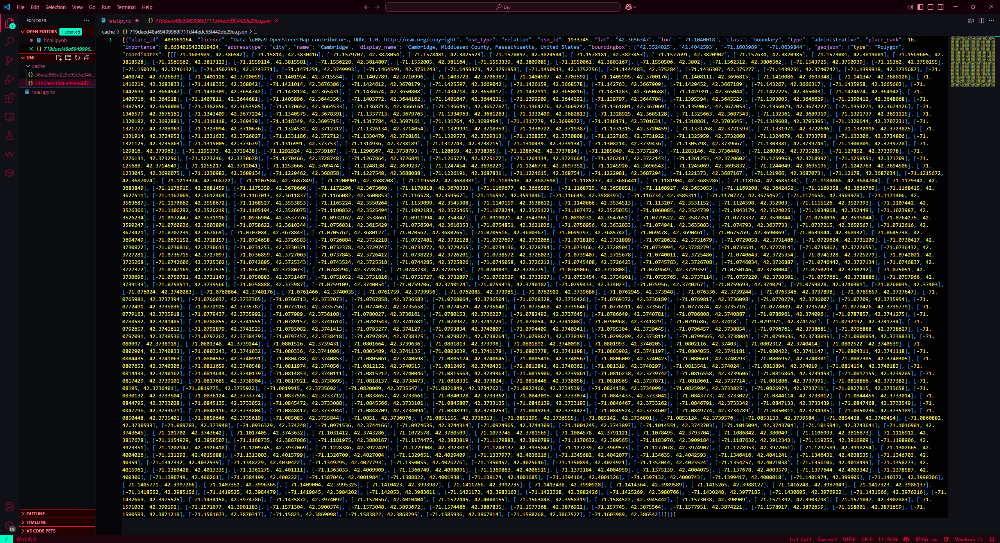

In [ ]:
#Here we retreive the hospitals from our city of interest and filtering out any potential null values
tags = {"amenity": "hospital"}
hospitals = ox.features_from_place(city, tags=tags)
hospitals = hospitals[~hospitals.geometry.isna()]


In [ ]:

hospitals_proj = hospitals.to_crs(hospitals.estimate_utm_crs())
hospitals_proj["geometry"] = hospitals_proj.geometry.centroid
hospitals = hospitals_proj.to_crs(epsg=4326)
hospitals["x"] = hospitals.geometry.x
hospitals["y"] = hospitals.geometry.y


Now we'll want to map each hospital to the closest graph node

In [ ]:
hospital_nodes = [
    ox.distance.nearest_nodes(G, x, y)
    for x, y in zip(hospitals["x"], hospitals["y"])
]


For the weights of the graph, we want it based on their lengths and we're required to use an algorithm for finding their distances. Thankfully to save me from a headache of making my own, NetworkX has some in their library. The algorithm I decided on using was the one that practically everyone on the internet says is the best for finding the shortest paths between nodes in a weighted graph, that being Dijkstra's.

In [ ]:
import networkx as nx

In [ ]:
lengths = nx.multi_source_dijkstra_path_length(G, hospital_nodes, weight='length')

In [ ]:
#This is just testing to see if everything worked out
print(f"Lengths: {len(lengths)} \nGraph Nodes: {len(G.nodes)}")
list(lengths.items())[:10]


Lengths: 1897 
Graph Nodes: 1906


[(61332347, 0),
 (4831798223, 0),
 (61329055, 0),
 (61327632, 30.601034267418605),
 (4831798222, 50.154179054489084),
 (61321023, 63.054731240559825),
 (61333964, 64.58679740183204),
 (61328810, 86.69039217212804),
 (61327700, 94.43557511426687),
 (61324418, 95.68501709955075)]

**Graph Visualization**

Turns out NetworkX uses matplotlib under the good to do the drawing so I was able to get the best of both worlds and use both of them in my vizualization. Mainly NetworkX is used for any logic or drawing on our graph while matplotlib will be the main driver of our presentation.

In [ ]:
import matplotlib.pyplot as plt


In [ ]:
nodes, edges = ox.graph_to_gdfs(G)

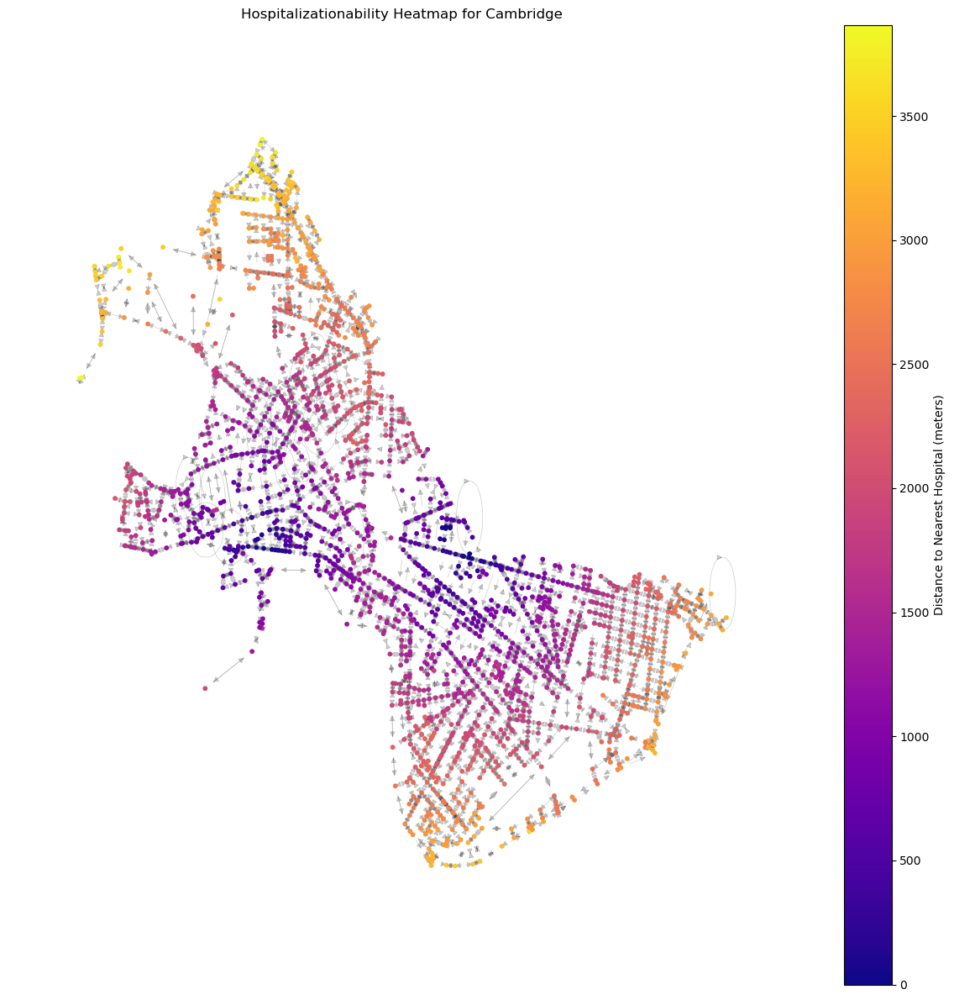

In [ ]:
#The following is the test out NetworkX and matplotlib together as well as getting our nodes ready for plotting onto a map
node_positions = {node: (data['x'], data['y']) for node, data in G.nodes(data=True)}
node_colors = [lengths.get(node, float("inf")) for node in G.nodes()]


plt.figure(figsize=(12, 12))
nodes = nx.draw_networkx_nodes(
    G,
    pos=node_positions,
    node_color=node_colors,
    node_size=10,
    cmap='plasma',
)

nx.draw_networkx_edges(G, pos=node_positions, alpha=0.2, width=0.5)

plt.colorbar(nodes, label="Distance to Nearest Hospital (meters)")
plt.title("Hospitalizationability Heatmap for Cambridge")
plt.axis("off")
plt.tight_layout()
plt.show()


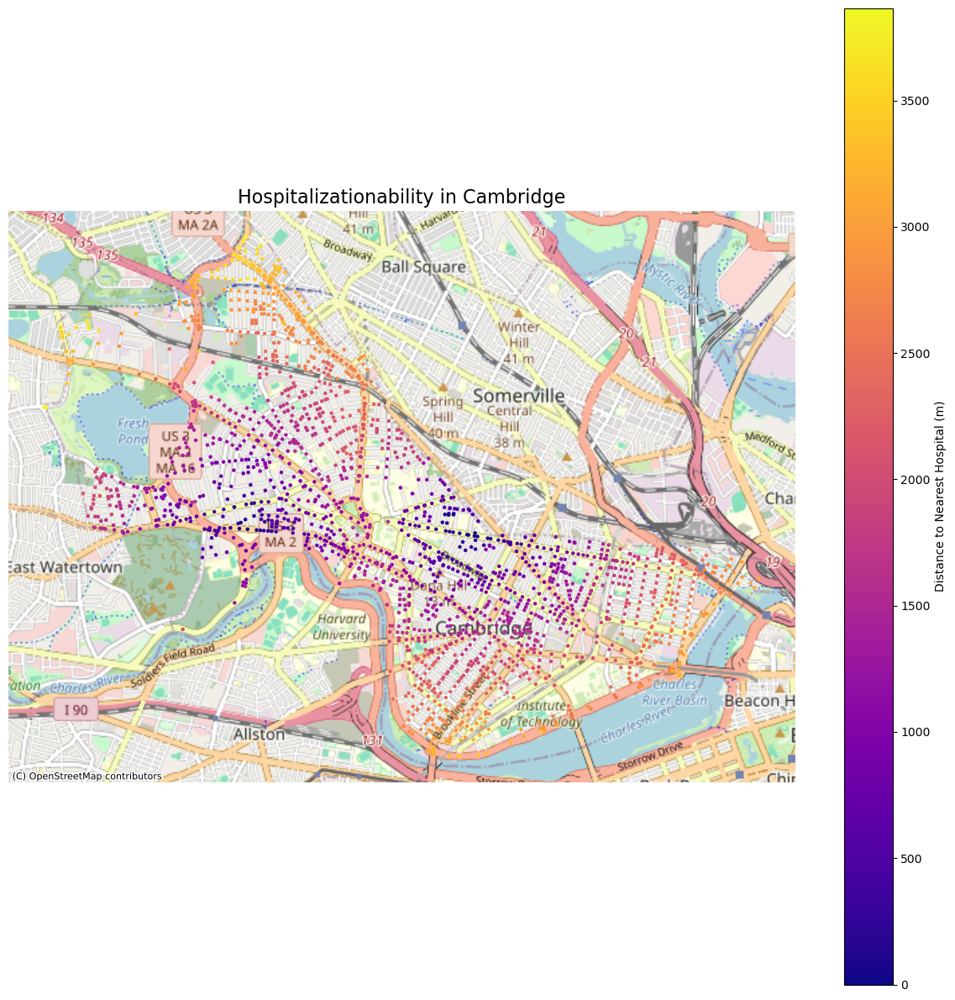

In [ ]:
#Adding a city map to our graph
import geopandas as gpd
import contextily as ctx

nodes, edges = ox.graph_to_gdfs(G)
nodes["distance_to_hospital"] = nodes.index.map(lengths)
nodes_proj = nodes.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 12))
nodes_proj.plot(
    ax=ax,
    column="distance_to_hospital",
    cmap="plasma",
    markersize=5,
    legend=True,
    legend_kwds={"label": "Distance to Nearest Hospital (m)"},
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_title("Hospitalizationability in Cambridge", fontsize=16)
ax.set_axis_off()
plt.tight_layout()
plt.show()


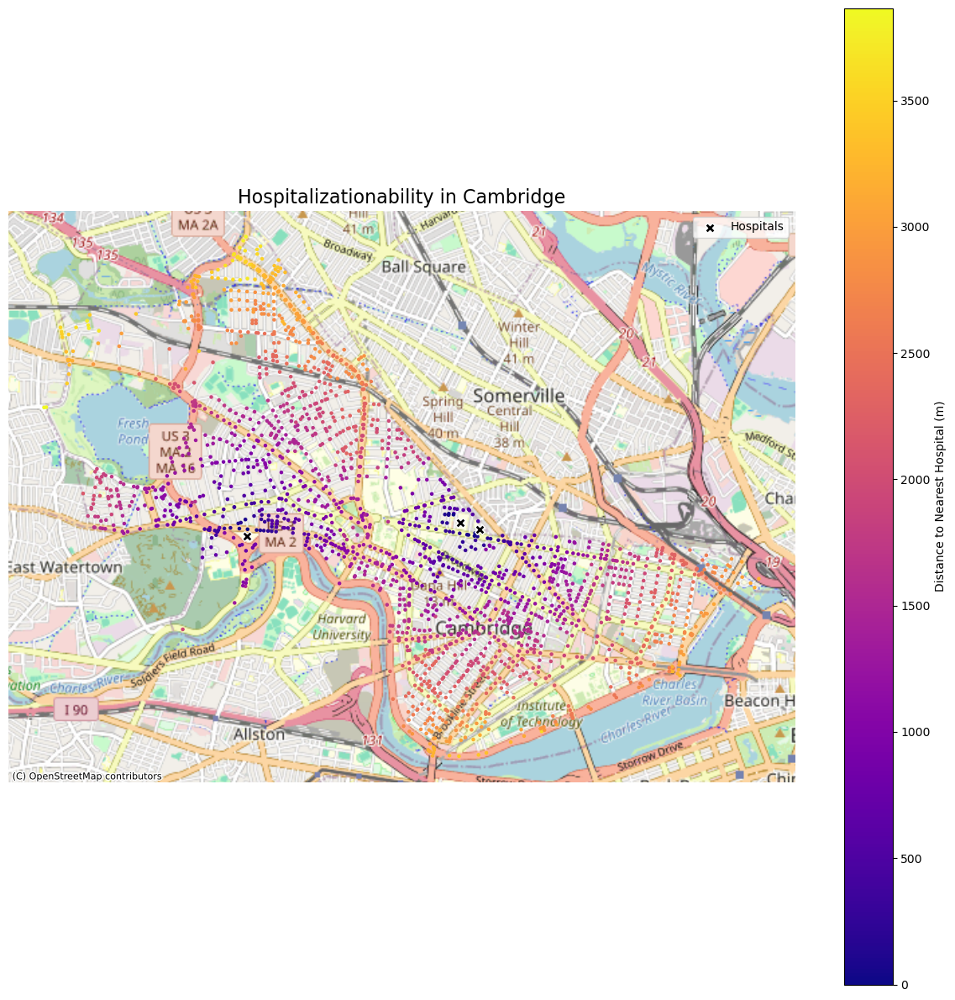

In [ ]:
#I could tell where the hospitals were on the map but I figured it would be better to actually plot them and the following does that
hospitals_proj = hospitals.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 12))

nodes_proj.plot(
    ax=ax,
    column="distance_to_hospital",
    cmap="plasma",
    markersize=5,
    legend=True,
    legend_kwds={"label": "Distance to Nearest Hospital (m)"},
)

hospitals_proj.plot(
    ax=ax,
    color="black",
    edgecolor="white",
    markersize=70,
    marker="X",
    label="Hospitals"
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Hospitalizationability in Cambridge", fontsize=16)
ax.set_axis_off()
plt.legend()
plt.tight_layout()
plt.show()


And just to confirm the accuracy, I also provided a screenshot from google maps that shows the hospitals locations in the x's




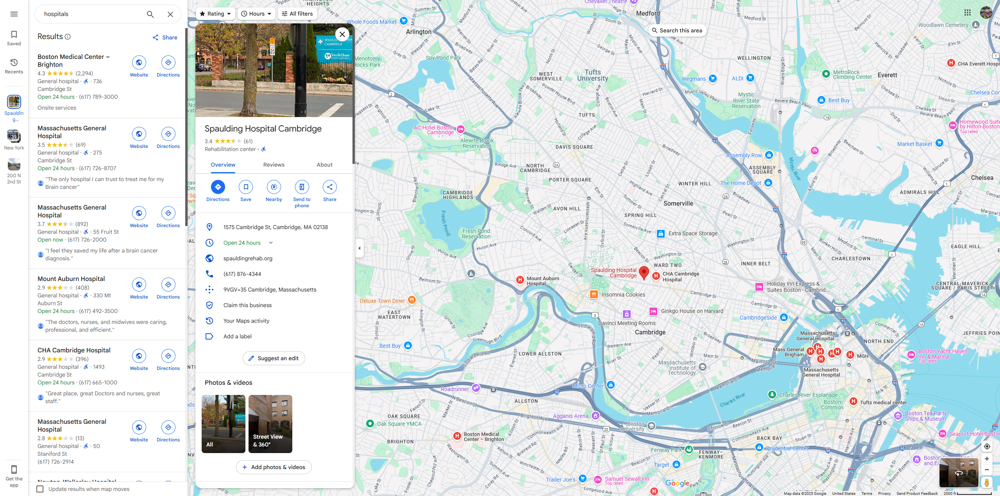

I wanted a better look of the points so I made a quick histogram to get an idea on how to formulate the "hospitalizationability" metric

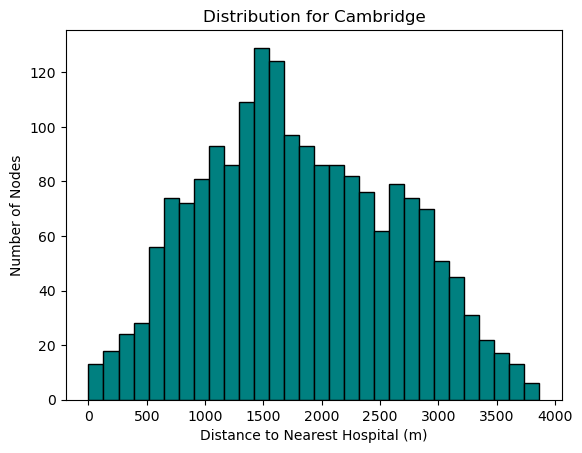

In [ ]:
plt.hist(lengths.values(), bins=30, color="teal", edgecolor="black")
plt.xlabel("Distance to Nearest Hospital (m)")
plt.ylabel("Number of Nodes")
plt.title("Distribution for Cambridge")
plt.show()

**Hospitalizationability**

My idea for a metric on "hospitalizationability" was simply getting the average of all the nodes lengths

In [ ]:
import numpy as np

#We already have the lengths from earlier
print("Lengths:", len(lengths))

Lengths: 1897


In [ ]:
average = np.mean(list(lengths.values()))
print(f"Hospitalizationability for Cambridge: {average:.2f} meters")

Hospitalizationability for Cambridge: 1810.59 meters


We got approximately 1810.59 meters which makes sense for a city like Cambrige. We see that there are only 3 hospitals in the area mostly skewed around the lower center of the city. But to get a better idea we should compare that number to another city of drastically different hospitalizationability. Automatically I'm leaning towards a heavy city like New York so thats what we'll calculate now.

**New York City**

So following the same steps as before, I'll instead chuck everything within a function for simplicity sake

In [ ]:
def city_hospitalization(city_name):
    G = ox.graph_from_place(city_name, network_type="drive")

    tags = {"amenity": "hospital"}
    hospitals = ox.features_from_place(city_name, tags=tags)
    hospitals = hospitals[~hospitals.geometry.isna()]
    hospitals = hospitals.to_crs(hospitals.estimate_utm_crs())
    hospitals["geometry"] = hospitals.geometry.centroid
    hospitals = hospitals.to_crs(epsg=4326)
    hospitals["x"] = hospitals.geometry.x
    hospitals["y"] = hospitals.geometry.y

    hospital_nodes = [
        ox.distance.nearest_nodes(G, x, y)
        for x, y in zip(hospitals["x"], hospitals["y"])
    ]

    if not hospital_nodes:
        return f"Unable to calculate hospitalizationability."

    lengths = nx.multi_source_dijkstra_path_length(G, hospital_nodes, weight='length')
    average = np.mean(list(lengths.values()))

    return f"Hospitalizationability of {city_name}: {average:.2f} meters"

print(city_hospitalization("Cambridge, Massachusetts, USA"))
print(city_hospitalization("New York City, New York, USA"))
print(city_hospitalization("Manhattan, New York, USA"))

Hospitalizationability of Cambridge, Massachusetts, USA: 1810.59 meters
Hospitalizationability of New York City, New York, USA: 2449.74 meters
Hospitalizationability of Manhattan, New York, USA: 1105.88 meters


In [ ]:
def visual(city_name):
    G = ox.graph_from_place(city_name, network_type="drive")

    tags = {"amenity": "hospital"}
    hospitals = ox.features_from_place(city_name, tags=tags)
    hospitals = hospitals[~hospitals.geometry.isna()]
    hospitals = hospitals.to_crs(hospitals.estimate_utm_crs())
    hospitals["geometry"] = hospitals.geometry.centroid
    hospitals = hospitals.to_crs(epsg=4326)
    hospitals["x"] = hospitals.geometry.x
    hospitals["y"] = hospitals.geometry.y

    hospital_nodes = [
        ox.distance.nearest_nodes(G, x, y)
        for x, y in zip(hospitals["x"], hospitals["y"])
    ]

    if not hospital_nodes:
        return f"Unable to calculate hospitalizationability."

    lengths = nx.multi_source_dijkstra_path_length(G, hospital_nodes, weight='length')

    nodes, edges = ox.graph_to_gdfs(G)
    nodes["distance_to_hospital"] = nodes.index.map(lengths)
    nodes_proj = nodes.to_crs(epsg=3857)
    hospitals_proj = hospitals.to_crs(epsg=3857)

    fig, ax = plt.subplots(figsize=(12, 12))
    nodes_proj.plot(
        ax=ax,
        column="distance_to_hospital",
        cmap="plasma",
        markersize=5,
        legend=True,
        legend_kwds={"label": "Distance to Nearest Hospital (m)"},
    )

    hospitals_proj.plot(
        ax=ax,
        color="black",
        edgecolor="white",
        markersize=70,
        marker="X",
        label="Hospitals"
    )

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    ax.set_title(f"Hospitalizationability Heatmap: {city_name}", fontsize=15)
    ax.set_axis_off()
    plt.legend()
    plt.tight_layout()
    plt.show()

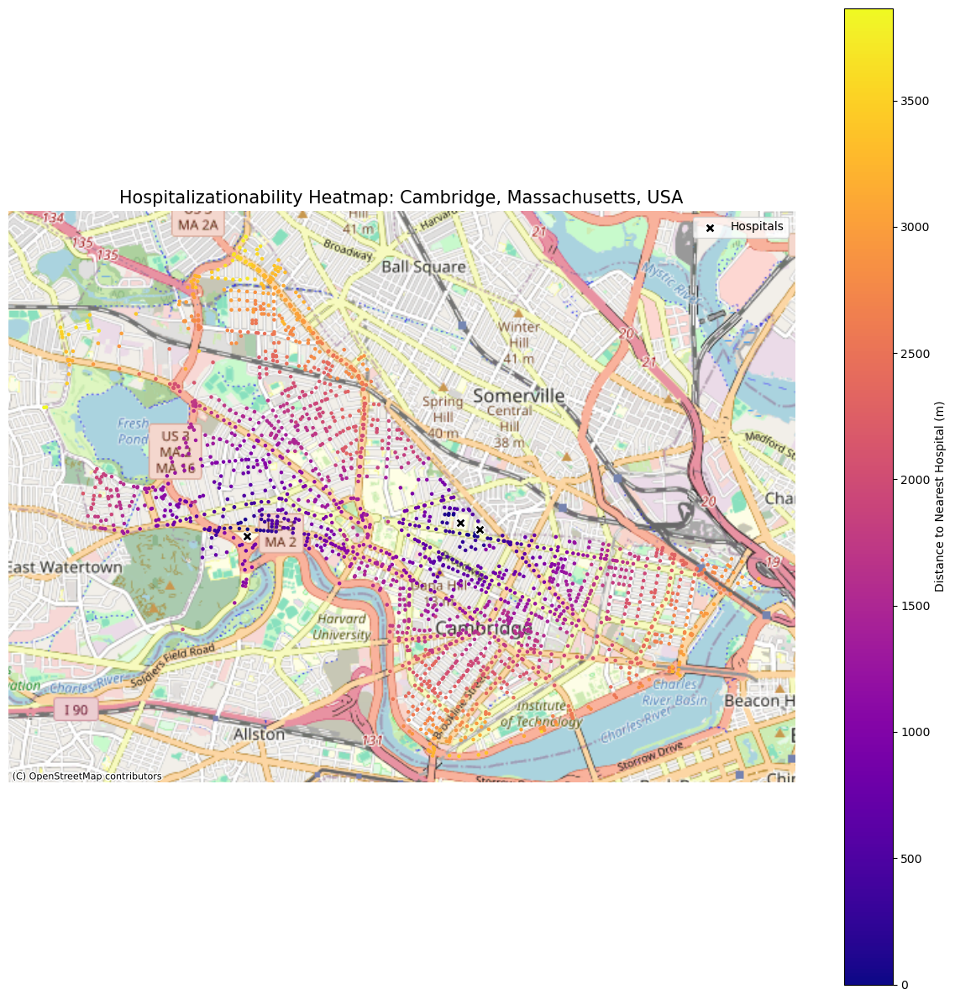

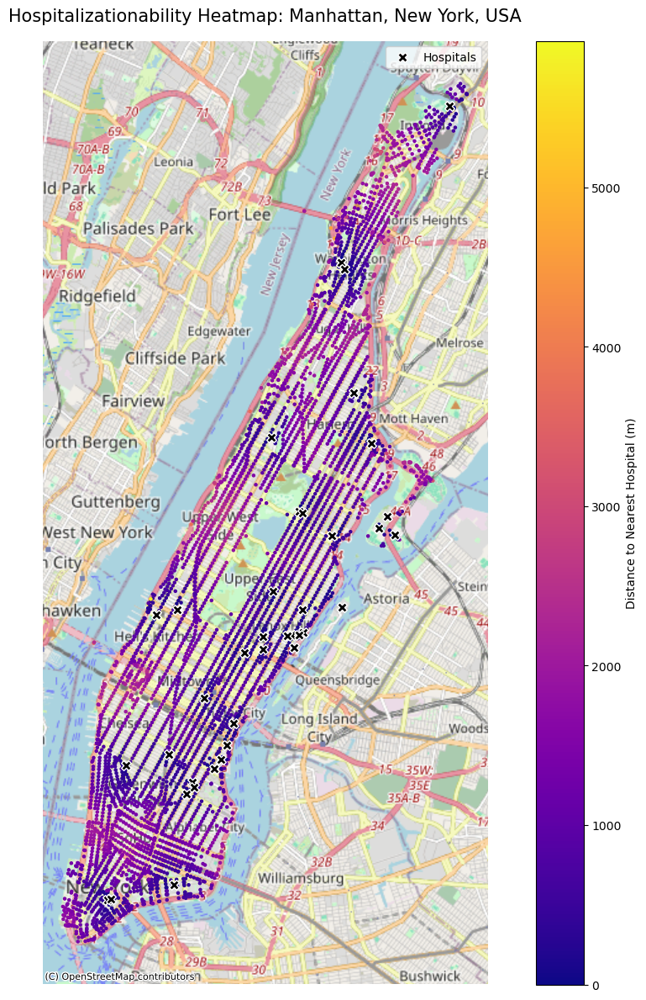

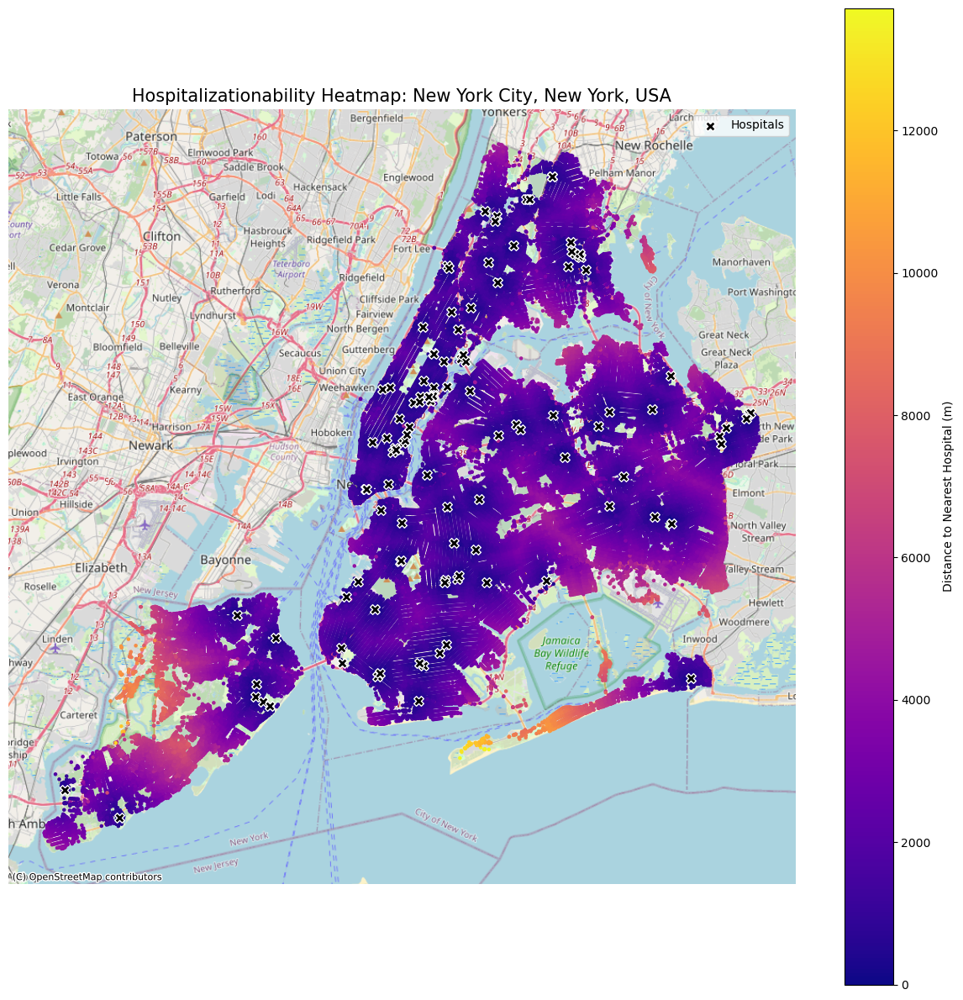

In [ ]:
visual("Cambridge, Massachusetts, USA")
visual("Manhattan, New York, USA")
visual("New York City, New York, USA")

We see that Manhattan has a better Hospitalizationability than Cambridge based on our metric and heatmap.

Sources Used:

*For Mapping & Visualization* - https://bryanbrattlof.com/adding-openstreetmaps-to-matplotlib/

*OSMnx* - https://osmnx.readthedocs.io/en/stable/user-reference.html

*NetworkX* - https://networkx.org/documentation/stable/reference/index.html

*Anything in regard to geomapping (Guides & Information)*
    
    https://guides.lib.vt.edu/c.php?g=1375762&p=10173315
    https://geopandas.org/en/stable/docs/user_guide.html
    https://www.geeksforgeeks.org/convert-multidigraph-to-geodataframe-using-osmnx-utils_graph-module/
    https://contextily.readthedocs.io/en/latest/reference.html






